In [4]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import seaborn as sns
import matplotlib.pyplot as plt
import nltk
nltk.download('stopwords', quiet=True)
from nltk.corpus import stopwords
from nltk.stem.porter import PorterStemmer
from sklearn.naive_bayes import MultinomialNB
from sklearn import metrics
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.multiclass import OneVsRestClassifier
from sklearn.metrics import accuracy_score, f1_score, classification_report,confusion_matrix
from sklearn.linear_model import LogisticRegression
from textblob import TextBlob
from wordcloud import WordCloud
from sklearn.svm import SVC
# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

In [6]:
twitter=pd.read_csv('C:/Users/Lokesh/Desktop/Oasis Infobite/tASK 4/Twitter_Data.csv')
twitter.head(5)

,clean_text,category
0,when modi promised “minimum government maximum...,-1.0
1,talk all the nonsense and continue all the dra...,0.0
2,what did just say vote for modi welcome bjp t...,1.0
3,asking his supporters prefix chowkidar their n...,1.0
4,answer who among these the most powerful world...,1.0


In [8]:
twitter['category'] = twitter['category'].replace({-1: 'negative', 0: 'neutral', 1: 'positive'})

In [10]:
twitter.head()

,clean_text,category
0,when modi promised “minimum government maximum...,negative
1,talk all the nonsense and continue all the dra...,neutral
2,what did just say vote for modi welcome bjp t...,positive
3,asking his supporters prefix chowkidar their n...,positive
4,answer who among these the most powerful world...,positive


In [12]:
twitter.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 162980 entries, 0 to 162979
Data columns (total 2 columns):
 #   Column      Non-Null Count   Dtype 
---  ------      --------------   ----- 
 0   clean_text  162976 non-null  object
 1   category    162973 non-null  object
dtypes: object(2)
memory usage: 2.5+ MB


In [14]:
twitter.isna().sum()

clean_text    4
category      7
dtype: int64

In [16]:
twitter.dropna(subset=['clean_text', 'category'], inplace=True)

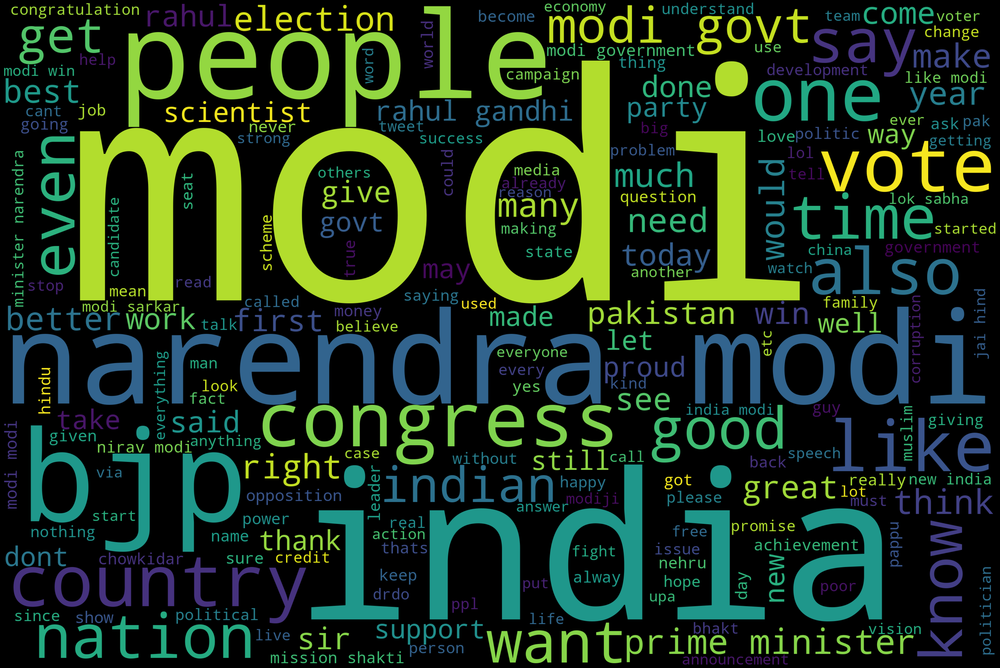

In [18]:
text = ''

for tweet in twitter[twitter['category'] == "positive"]['clean_text']:
    text += f" {tweet}"
    
wordcloud = WordCloud(
width=3000, height=2000, background_color='black',
stopwords = set(nltk.corpus.stopwords.words("english"))).generate(text)

fig = plt.figure(figsize=(40,30), facecolor='k',edgecolor='k')

plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show

del text

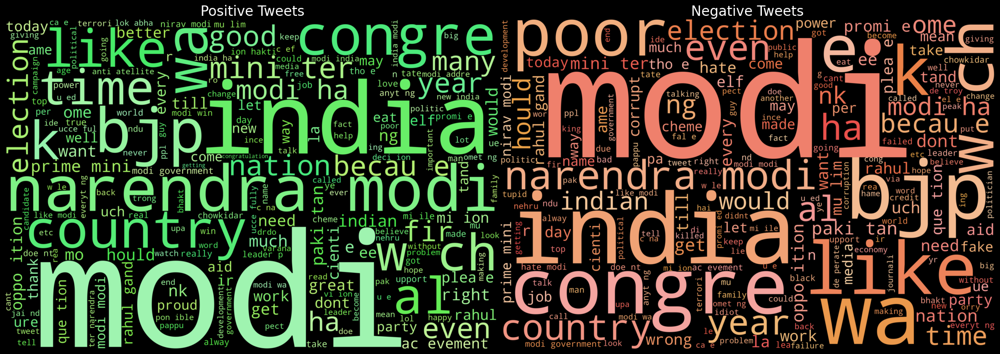

In [22]:
import random
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import nltk

# Combine clean text from positive and negative categories
positive_text = ''
for tweet in twitter[twitter['category'] == "positive"]['clean_text']:
    positive_text += f" {tweet}"

negative_text = ''
for tweet in twitter[twitter['category'] == "negative"]['clean_text']:
    negative_text += f" {tweet}"

# Remove noise words
noise_words = {'will', 'make', 'people', 'say', 'vote', 'now', 'give',
               's', 'one', 'govt', 'thi', 'hi', 'ju', 'hi'}

# Function to remove noise words
def remove_noise(text, noise_words):
    for noise in noise_words:
        text = text.lower().replace(noise, " ")
    return text

# Clean positive and negative text
positive_text = remove_noise(positive_text, noise_words)
negative_text = remove_noise(negative_text, noise_words)

# Define custom color functions
def green_color(word, font_size, position, orientation, random_state=None, **kwargs):
    return f'hsl({random.randint(85, 140)}, 80%, {random.randint(60, 80)}%)'

def red_color(word, font_size, position, orientation, random_state=None, **kwargs):
    return f'hsl({random.randint(0, 35)}, 80%, {random.randint(60, 80)}%)'

# Generate word clouds
wordcloud_positive = WordCloud(
    width=3000, height=2000, background_color='black',
    stopwords=set(nltk.corpus.stopwords.words("english"))
).generate(positive_text)

wordcloud_negative = WordCloud(
    width=3000, height=2000, background_color='black',
    stopwords=set(nltk.corpus.stopwords.words("english"))
).generate(negative_text)

# Plot the word clouds
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10), facecolor='k')

# Positive tweets word cloud
ax1.imshow(wordcloud_positive.recolor(color_func=green_color, random_state=3), interpolation='bilinear')
ax1.axis('off')
ax1.set_title('Positive Tweets', fontsize=20, color='white')

# Negative tweets word cloud
ax2.imshow(wordcloud_negative.recolor(color_func=red_color, random_state=3), interpolation='bilinear')
ax2.axis('off')
ax2.set_title('Negative Tweets', fontsize=20, color='white')

plt.tight_layout(pad=0)
plt.show()

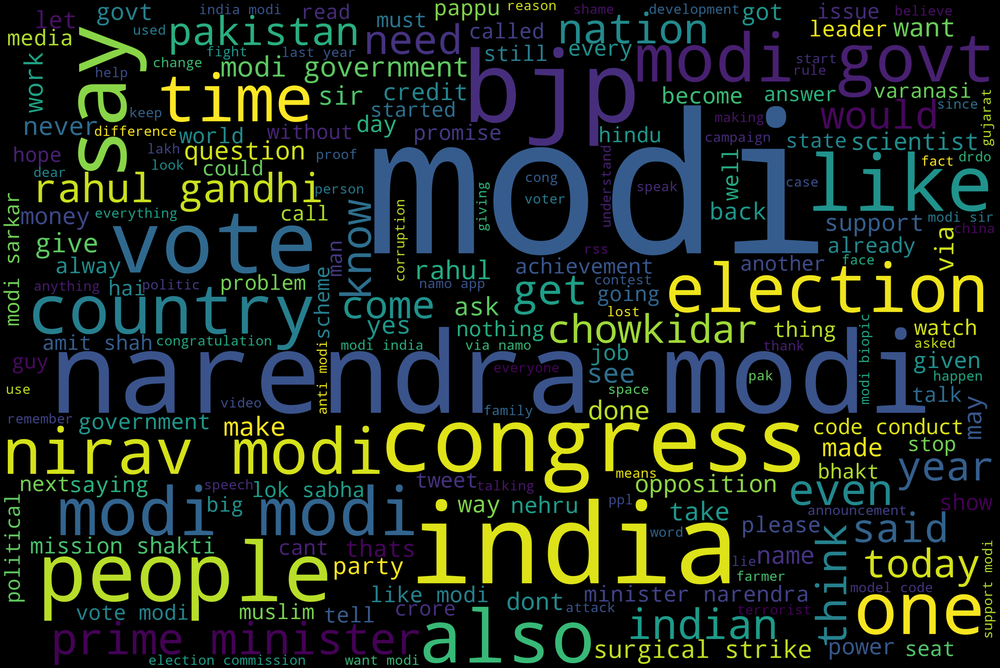

In [24]:
text = ''

for tweet in twitter[twitter['category'] == "neutral"]['clean_text']:
    text += f" {tweet}"
    
wordcloud = WordCloud(
width=3000, height=2000, background_color='black',
stopwords = set(nltk.corpus.stopwords.words("english"))).generate(text)

fig = plt.figure(figsize=(40,30), facecolor='k',edgecolor='k')

plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show

del text

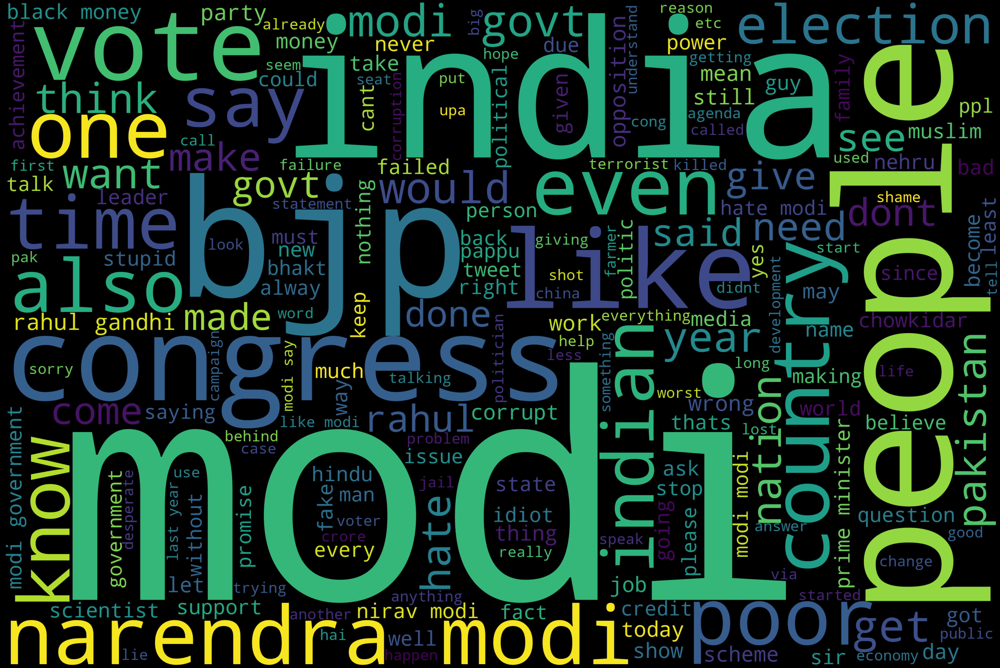

In [26]:
text = ''

for tweet in twitter[twitter['category'] == "negative"]['clean_text']:
    text += f" {tweet}"
    
wordcloud = WordCloud(
width=3000, height=2000, background_color='black',
stopwords = set(nltk.corpus.stopwords.words("english"))).generate(text)

fig = plt.figure(figsize=(40,30), facecolor='k',edgecolor='k')

plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show

del text

In [28]:
print(twitter['category'].value_counts())

category
positive    72249
neutral     55211
negative    35509
Name: count, dtype: int64


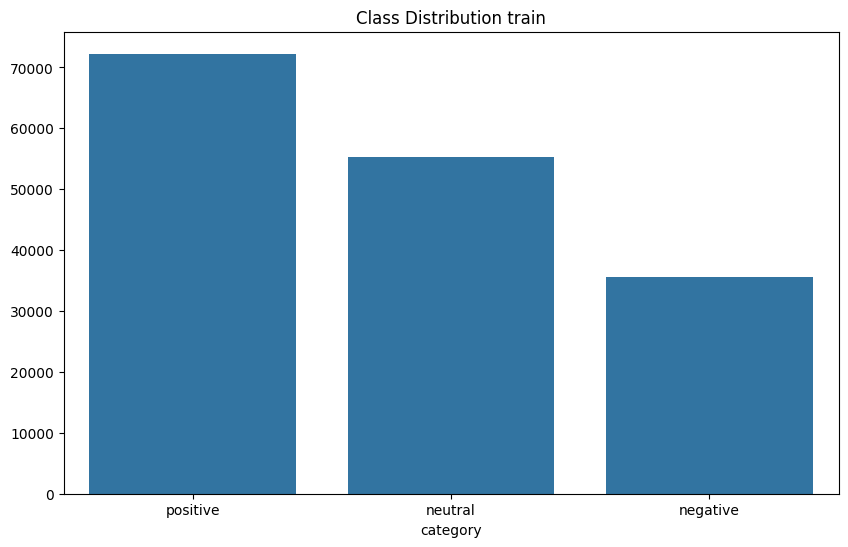

In [30]:
dist = twitter['category'].value_counts()
def distribution_plot(x, y, name):
    plt.figure(figsize=(10, 6))
    sns.barplot(x=x, y=y)
    plt.title(name)
    plt.show()

distribution_plot(x=dist.index, y=dist.values, name='Class Distribution train')

In [32]:
pol = lambda x: TextBlob(x).sentiment.polarity
sub = lambda x: TextBlob(x).sentiment.subjectivity

twitter['polarity'] = twitter['clean_text'].apply(pol)
twitter['subjectivity'] = twitter['clean_text'].apply(sub)
twitter

,clean_text,category,polarity,subjectivity
0,when modi promised “minimum government maximum...,negative,-0.300000,0.700000
1,talk all the nonsense and continue all the dra...,neutral,0.000000,0.000000
2,what did just say vote for modi welcome bjp t...,positive,0.483333,0.616667
3,asking his supporters prefix chowkidar their n...,positive,0.150000,0.658333
4,answer who among these the most powerful world...,positive,0.400000,0.750000
...,...,...,...,...
162975,why these 456 crores paid neerav modi not reco...,negative,-0.291667,0.541667
162976,dear rss terrorist payal gawar what about modi...,negative,-0.195833,0.433333
162977,did you cover her interaction forum where she ...,neutral,0.000000,0.000000
162978,there big project came into india modi dream p...,neutral,0.000000,0.100000


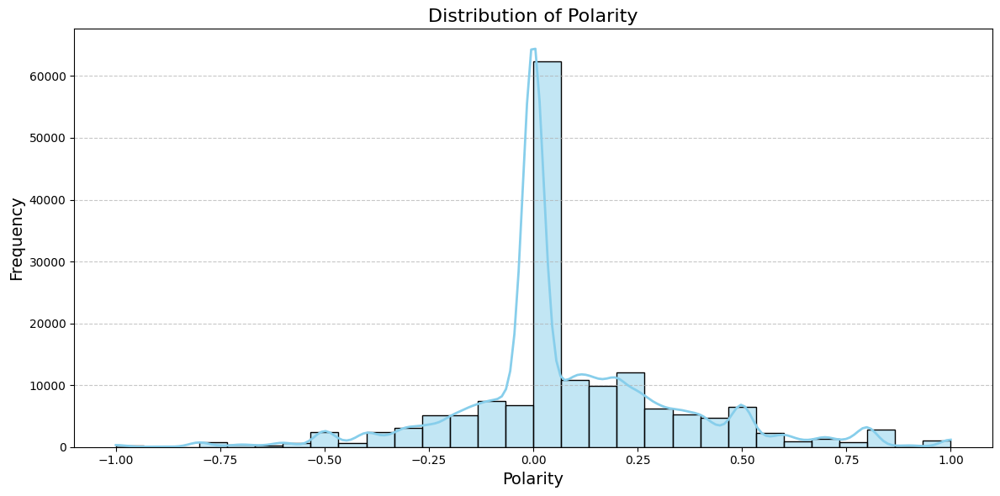

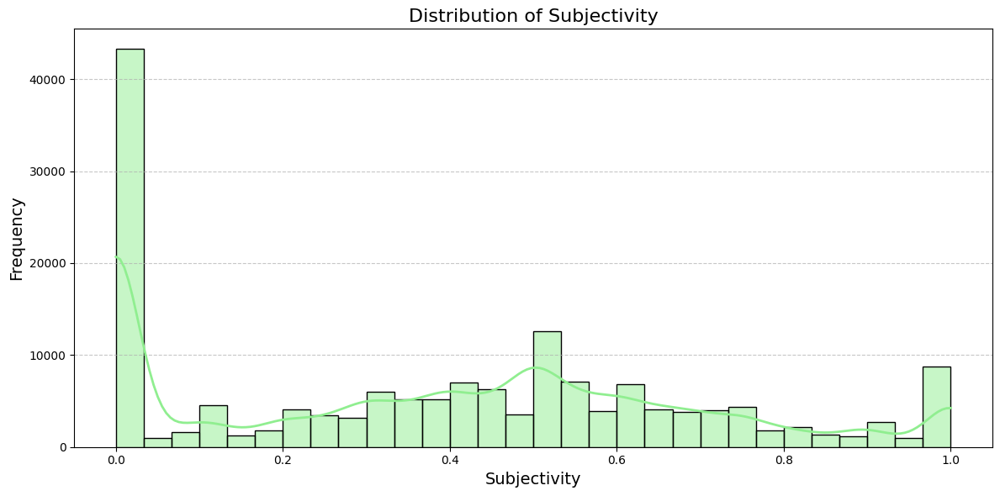

In [38]:
import seaborn as sns
import matplotlib.pyplot as plt

# Advanced Plot for Polarity
plt.figure(figsize=(12, 6))
sns.histplot(
    twitter['polarity'], bins=30, kde=True, color='skyblue',
    edgecolor='black', line_kws={"linewidth": 2}
)
plt.title('Distribution of Polarity', fontsize=16)
plt.xlabel('Polarity', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Advanced Plot for Subjectivity
plt.figure(figsize=(12, 6))
sns.histplot(
    twitter['subjectivity'], bins=30, kde=True, color='lightgreen',
    edgecolor='black', line_kws={"linewidth": 2}
)
plt.title('Distribution of Subjectivity', fontsize=16)
plt.xlabel('Subjectivity', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

In [40]:
vectorizer = TfidfVectorizer(max_features=5000)
X = vectorizer.fit_transform(twitter['clean_text'])

# Encode target labels (category) directly into numeric values
y = twitter['category'].map({'negative': 0, 'neutral': 1, 'positive': 2})

# Split the dataset into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train a Logistic Regression classifier
lr = LogisticRegression(max_iter=1000)
lr.fit(X_train, y_train)

# Predict on test set
y_pred = lr.predict(X_test)

# Evaluate the classifier
print("Accuracy:", accuracy_score(y_test, y_pred))
print("F1 Score:", f1_score(y_test, y_pred, average='weighted'))
print("Classification Report:\n", classification_report(y_test, y_pred))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))

Accuracy: 0.92517027673805
F1 Score: 0.9243329672925927
Classification Report:
               precision    recall  f1-score   support

           0       0.91      0.83      0.87      7152
           1       0.92      0.98      0.95     11067
           2       0.94      0.93      0.94     14375

    accuracy                           0.93     32594
   macro avg       0.92      0.91      0.92     32594
weighted avg       0.93      0.93      0.92     32594

Confusion Matrix:
 [[ 5904   527   721]
 [   87 10825   155]
 [  482   467 13426]]


In [42]:
nb = MultinomialNB()
nb.fit(X_train, y_train)

# Predict on test set
y_pred_nb = nb.predict(X_test)

# Evaluate the classifier
print("Naive Bayes Accuracy:", accuracy_score(y_test, y_pred_nb))
print("Naive Bayes F1 Score:", f1_score(y_test, y_pred_nb, average='weighted'))
print("Naive Bayes Classification Report:\n", classification_report(y_test, y_pred_nb))
print("Naive Bayes Confusion Matrix:\n", confusion_matrix(y_test, y_pred_nb))

Naive Bayes Accuracy: 0.7373442964962876
Naive Bayes F1 Score: 0.7245100426825176
Naive Bayes Classification Report:
               precision    recall  f1-score   support

           0       0.91      0.42      0.57      7152
           1       0.88      0.67      0.76     11067
           2       0.65      0.95      0.78     14375

    accuracy                           0.74     32594
   macro avg       0.81      0.68      0.70     32594
weighted avg       0.79      0.74      0.72     32594

Naive Bayes Confusion Matrix:
 [[ 2982   539  3631]
 [   92  7368  3607]
 [  208   484 13683]]
